In [1]:
#importing all the modules/packages
import pandas as pd #Data operations
import numpy as np #Array and Data operations

import seaborn as sns #Visualization library
import matplotlib.pyplot as plt #Plot library

from plotly import tools #Interavtive Visualization library
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.express as px
import plotly.offline as py
py.init_notebook_mode(connected=True)

import folium #Interactive Maps Visualization library

import warnings #for filtering warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [90]:
#reading the CSV file from local
data = pd.read_csv('zomato.csv')
#Getting information about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
url                            51717 non-null object
address                        51717 non-null object
name                           51717 non-null object
online_order                   51717 non-null object
book_table                     51717 non-null object
rate                           43942 non-null object
votes                          51717 non-null int64
phone                          50509 non-null object
location                       51696 non-null object
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null object
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
listed_in(type)                51717 non-null object
listed_in(city)                51717 non-nul

In [91]:
data= data.drop(['url','address','reviews_list','listed_in(city)','menu_item'],axis=1) #drop unwanted columns

data=data.rename(columns={'approx_cost(for two people)':'approx_cost','listed_in(type)':'type'}) #rename columns for convinience

data['online_order']= data['online_order'].apply(lambda a: '1' if str(a)=='Yes' else '0') 
data['online_order']= data['online_order'].astype('int') #Changing categorical features for statstical computation

data['book_table']=data['book_table'].apply(lambda b: '1' if str(b)=='Yes' else '0')
data['book_table']= data['book_table'].astype('int') #Changing categorical features for statstical computation

data['rate']=data['rate'].apply(lambda c: str(c).split('/')[0]) #data formatting
data['approx_cost']=data['approx_cost'].apply(lambda d: str(d).replace(',',''))

data.dropna(subset=['rate','approx_cost','phone','dish_liked']) #dropping null values and cleaning data
data=data[data['rate']!='nan']
data=data[data['rate']!='NEW']
data=data[data['rate']!='-']
data=data[data['approx_cost']!='nan']

data['rate']=data['rate'].astype(float) #Changing datatype of features for statstical computation
data['votes']=data['votes'].astype(int) #Changing datatype of features for statstical computation
data['approx_cost']=data['approx_cost'].astype(int) #Changing datatype of features for statstical computation

data['phone']=data['phone'].apply(lambda f: '2' if len(str(f))>12 else '1') 
data['phone']=data['phone'].astype('int')#Changing categorical features for statstical computation


In [92]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41418 entries, 0 to 51716
Data columns (total 12 columns):
name            41418 non-null object
online_order    41418 non-null int32
book_table      41418 non-null int32
rate            41418 non-null float64
votes           41418 non-null int32
phone           41418 non-null int32
location        41418 non-null object
rest_type       41271 non-null object
dish_liked      23327 non-null object
cuisines        41410 non-null object
approx_cost     41418 non-null int32
type            41418 non-null object
dtypes: float64(1), int32(5), object(6)
memory usage: 3.3+ MB


In [93]:
#Creating separate DF for unique Location values
str1=',Banglore,India'
data['location1']=data['location'].apply(lambda e: (str(e)+str1)) 
#Appending State and Country name to get accurate results
location_counts=data['location1'].unique() #unique location values
print(len(location_counts))
print('*'*10)
data_location=pd.DataFrame(data=location_counts)
data_location.head() #new location specific dataframe

92
**********


,0
0,"Banashankari,Banglore,India"
1,"Basavanagudi,Banglore,India"
2,"Mysore Road,Banglore,India"
3,"Jayanagar,Banglore,India"
4,"Kumaraswamy Layout,Banglore,India"


In [94]:
#Main process for computing Lattitude and Longitude values from given Location by GeoCode API

import googlemaps

API_key= "Put your API Key from GCP" #My Google API Key

gmaps_key=googlemaps.Client(key=API_key)

data_location["LAT"]=None
data_location["LON"]=None

for i in range(0,len(data_location)):
    geocode_result=gmaps_key.geocode(data_location.iat[i,0])
    try:
        lat=geocode_result[0]['geometry']['location']['lat']
        lon=geocode_result[0]['geometry']['location']['lng']
        data_location.iat[i,data_location.columns.get_loc('LAT')]=lat
        data_location.iat[i,data_location.columns.get_loc('LON')]=lon
    except:
        lat=None
        lon=None
        
data_location.head(2)

,0,LAT,LON
0,"Banashankari,Banglore,India",12.9255,77.5468
1,"Basavanagudi,Banglore,India",12.9406,77.5738


In [95]:
#Mapping LAT and LON values of unique location names to main DF
#This process is written to reduce time complexity and cost of API request calls

data["LAT"]=None
data["LON"]=None
for j in range(0,len(data),1):
    for i in range (0,len(data_location),1):
        if(data_location.iat[i,0]==data.iat[j,12]):
            data.iat[j,data.columns.get_loc('LAT')]=data_location.iat[i,data_location.columns.get_loc('LAT')]
            data.iat[j,data.columns.get_loc('LON')]=data_location.iat[i,data_location.columns.get_loc('LON')]

In [97]:
#drop unwanted columns
data= data.drop(['location1'],axis=1)    
data.head(2)

,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost,type,LAT,LON
0,Jalsa,1,1,4.1,775,2,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,12.9255,77.5468
1,Spice Elephant,1,0,4.1,787,1,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,12.9255,77.5468


Histogram from data : 


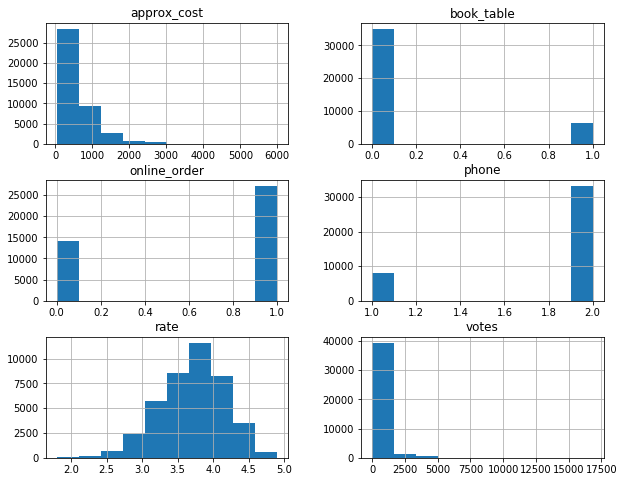

In [76]:
print('Histogram from data : ')
data.hist(figsize=(10,8))
plt.show()


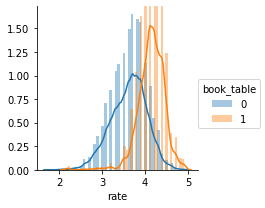

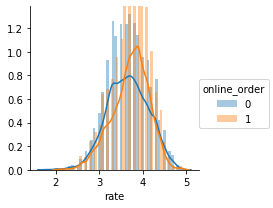

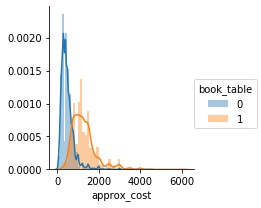

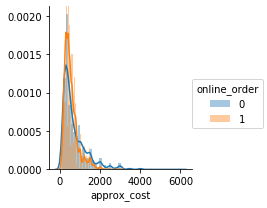

In [12]:
#PDF Histogram Plots

sns.FacetGrid(data, hue="book_table").map(sns.distplot, "rate").add_legend()
plt.show()

sns.FacetGrid(data, hue="online_order").map(sns.distplot, "rate").add_legend()
plt.show()

sns.FacetGrid(data, hue="book_table").map(sns.distplot, "approx_cost").add_legend()
plt.show()

sns.FacetGrid(data, hue="online_order").map(sns.distplot, "approx_cost").add_legend()
plt.show()

<Figure size 2160x576 with 0 Axes>

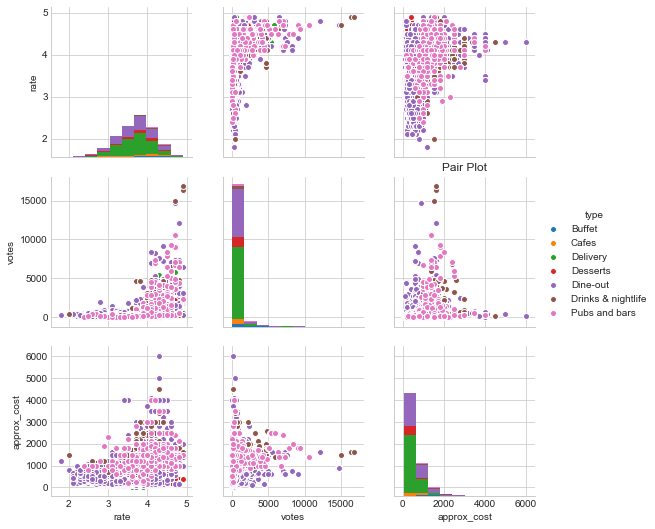

In [78]:
#Pair Plots

plt.figure(figsize=(30,8))
sns.set_style('whitegrid')
sns.pairplot(data,hue="type",vars=['rate','votes','approx_cost'])
plt.title('Pair Plot')
plt.show()

In [63]:
#Interactive donut charts

labels = data.type

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=data.rate, name="Type based Rating"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=data.approx_cost, name="Type based cost"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.3, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Pie chart evaluation : Type based",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Rating', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Cost', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [64]:
#Interactive donut charts

labels = data.type

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=data.book_table, name="Book Table"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=data.approx_cost, name="Online order"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.3, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Pie chart evaluation : Booking based",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Book', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Online', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [65]:
#Interactive Histogram

fig = px.histogram(data, x='location')
fig.update_layout(
    title_text="Location Histogram")
fig.show()

In [66]:
#Interactive Histogram

fig = px.histogram(data, x="location", color="type")
fig.update_layout(
    title_text="Location Histogram with Type as Hue")
fig.show()

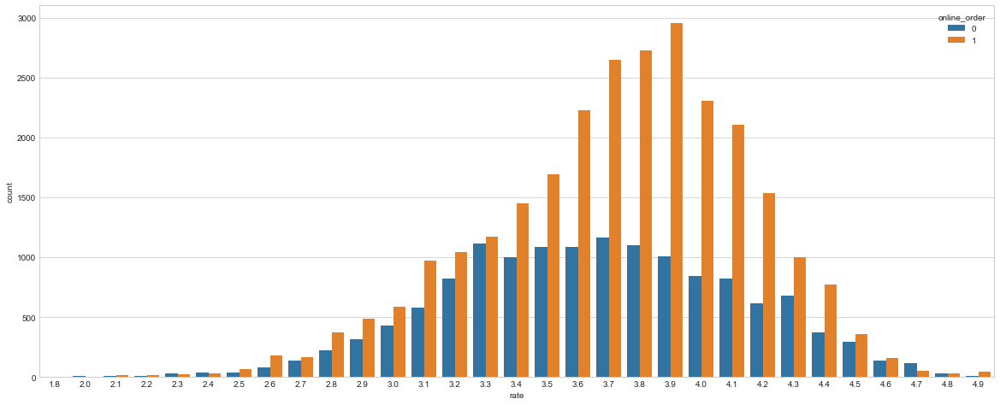

In [68]:
#SNS Histogram

plt.figure(figsize=(20,8))
sns.countplot(data['rate'],hue='online_order',data=data)

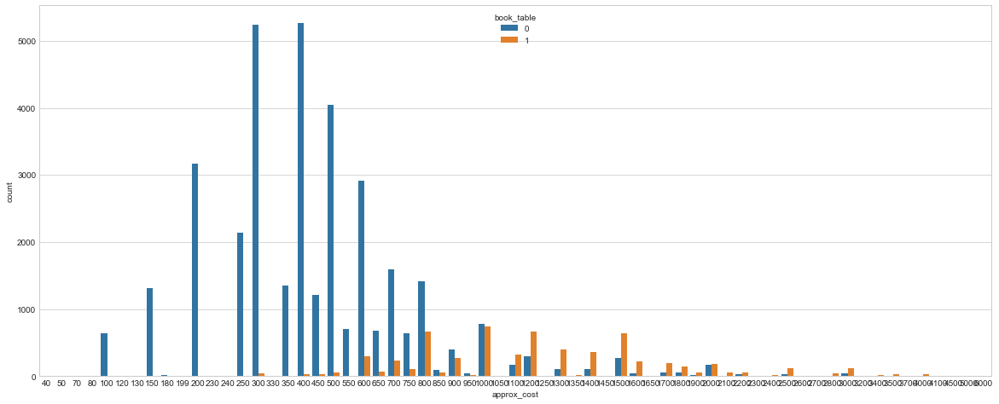

In [69]:
#SNS Histogram

plt.figure(figsize=(20,8))
sns.countplot(data['approx_cost'],hue='book_table',data=data)

In [72]:
#Interactive scatter plot

fig = px.scatter(data, x="location", y="rate", color="type",size='approx_cost')
fig.update_layout(
    title_text="Scatter plot based on Type")
fig.show()


****************************************************************************************************

Location Wordcloud :


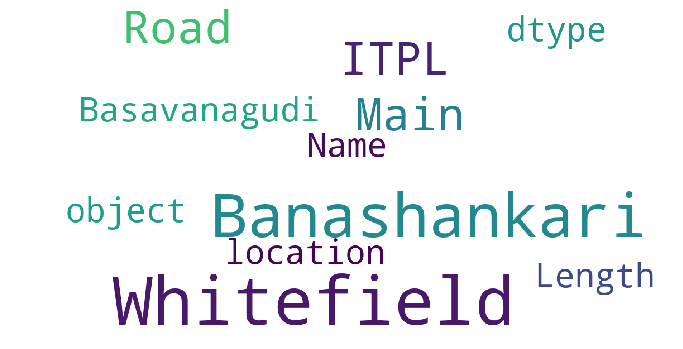

****************************************************************************************************


In [86]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
    
print('*'*100)
print('\nLocation Wordcloud :')
show_wordcloud(data['location'])
print('*'*100)


In [99]:
#Creating separate DF for plotting Location values on Folium
loc_rate=data
pd.DataFrame(loc_rate)
#data transfer loops
loc_rate["name1"]=None
loc_rate["rate1"]=None
loc_rate["location1"]=None
loc_rate["type1"]=None
loc_rate["votes1"]=None
loc_rate["LAT1"]=None
loc_rate["LON1"]=None
for j in range(0,len(data), ):
    if(data.iat[j,3]>4.2 and ((data.iat[j,11]=='Delivery')or(data.iat[j,11]=='Dine-out'))): #getting best restaurants
        loc_rate.iat[j,loc_rate.columns.get_loc('name1')]=data.iat[j,data.columns.get_loc('name')]
        loc_rate.iat[j,loc_rate.columns.get_loc('rate1')]=data.iat[j,data.columns.get_loc('rate')]
        loc_rate.iat[j,loc_rate.columns.get_loc('location1')]=data.iat[j,data.columns.get_loc('location')]
        loc_rate.iat[j,loc_rate.columns.get_loc('votes1')]=data.iat[j,data.columns.get_loc('votes')]
        loc_rate.iat[j,loc_rate.columns.get_loc('type1')]=data.iat[j,data.columns.get_loc('type')]
        loc_rate.iat[j,loc_rate.columns.get_loc('LAT1')]=data.iat[j,data.columns.get_loc('LAT')]
        loc_rate.iat[j,loc_rate.columns.get_loc('LON1')]=data.iat[j,data.columns.get_loc('LON')]
        
loc_rate= loc_rate.drop(['name','online_order','book_table','rate','votes','phone',
                         'location','rest_type','dish_liked','cuisines','approx_cost','type','LAT','LON'],axis=1)
loc_rate.drop_duplicates(subset ="name1", 
                     keep = False, inplace = True) 

loc_rate['rate1']=loc_rate['rate1'].astype(float)
loc_rate['LAT1']=loc_rate['LAT1'].astype(float)
loc_rate['LON1']=loc_rate['LON1'].astype(float)
loc_rate['votes1']=loc_rate['votes1'].astype(float)
loc_rate.info()        

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65 entries, 632 to 51607
Data columns (total 7 columns):
name1        65 non-null object
rate1        65 non-null float64
location1    65 non-null object
type1        65 non-null object
votes1       65 non-null float64
LAT1         65 non-null float64
LON1         65 non-null float64
dtypes: float64(4), object(3)
memory usage: 4.1+ KB


In [33]:
#Interactive Maps through Folium 

print('Locations of high rated restaurants for Delivery and Dineout')
m = folium.Map(
    location=[12.97194, 77.59369],
    zoom_start=12,
    tiles='Stamen Terrain'
)

for i in range(0,len(loc_rate),1):
    folium.Marker(
    [loc_rate.iat[i,4], loc_rate.iat[i,5]],
    popup= "{},{}".format(loc_rate.iat[i,0], loc_rate.iat[i,2])
    ).add_to(m)


m

Locations of high rated restaurants for Delivery and Dineout


In [34]:
#Interactive Maps through Folium 


m1 = folium.Map(
    location=[12.97194, 77.59369],
    zoom_start=12,
    tiles='Stamen Terrain'
)

m2 = folium.Map(
    location=[12.97194, 77.59369],
    zoom_start=12,
    tiles='Stamen Terrain'
)

for i in range(0,len(loc_rate),1):
    tooltip = 'Click me!'
    
    if(loc_rate.iat[i,3]=='Dine-out'):
        folium.Marker(
        location=[loc_rate.iat[i,4], loc_rate.iat[i,5]],
        popup="{}:{},{}".format(loc_rate.iat[i,3],loc_rate.iat[i,0], loc_rate.iat[i,2]),
        icon=folium.Icon(icon='cloud')
        ).add_to(m2)
    
    elif(loc_rate.iat[i,3]=='Delivery'):
        folium.Marker(
        location=[loc_rate.iat[i,4], loc_rate.iat[i,5]],
        popup="{}:{},{}".format(loc_rate.iat[i,3],loc_rate.iat[i,0], loc_rate.iat[i,2]),
        icon=folium.Icon(color='red', icon='info-sign')
        ).add_to(m1)   
     
   
print('Locations of high rated restaurants for Delivery')

m1

Locations of high rated restaurants for Delivery


In [35]:
#Interactive Maps through Folium 

print('Locations of high rated restaurants for Dine-out')
m2

Locations of high rated restaurants for Dine-out


In [79]:
from folium import plugins
heatmap_map=folium.Map(location=[12.97194, 77.59369],
    zoom_start=12,tiles='stamentoner')

map_data=list(zip(loc_rate.LAT1.values,loc_rate.LON1.values,loc_rate.rate1.values))


hm=plugins.HeatMap(data=map_data,min_opacity=0.2,
                     radius=17, blur=15,
                     max_zoom=1 )

heatmap_map.add_children(hm)
print('Heatmap based on locations')
heatmap_map

Heatmap based on locations
